In [1]:
# Import the Pillow library, essential for opening, manipulating, and saving many different image file formats
!pip install Pillow

# Standard imports for handling files and directories
import os

# Import torch for building and training neural networks using automatic differentiation
import torch
# nn module from PyTorch to access network layers predefined that can be easily integrated into the model
from torch import nn

# tqdm for a progress bar that wraps around any iterable, used here to show the training progress
from tqdm.auto import tqdm

# torchvision transforms for common image transformations
from torchvision import transforms
# datasets module from torchvision for loading and transforming popular datasets
from torchvision import datasets
# Pre-trained Inception V3 model from torchvision
from torchvision.models import inception_v3
# make_grid from torchvision to make an image grid from a list of images
from torchvision.utils import make_grid

# DataLoader from PyTorch for easy data loading, batching, and shuffling
from torch.utils.data import DataLoader

# summary to display models architecture
from torchinfo import summary

# scipy for scientific computing tools and techniques
import scipy
# truncnorm from scipy.stats to generate values from a truncated normal distribution, which are normal values restricted to a certain range
from scipy.stats import truncnorm

# numpy for numerical operations on arrays
import numpy as np
# pandas for data manipulation and analysis
import pandas as pd

# MultivariateNormal from torch.distributions for creating multivariate normal distributions, used for sampling in probabilistic models
from torch.distributions import MultivariateNormal

# seaborn for statistical data visualization
import seaborn as sns
# matplotlib.pyplot for creating static, interactive, and animated visualizations in Python
import matplotlib.pyplot as plt

# Image module from PIL for opening, manipulating, and saving many different image file formats
from PIL import Image

# matplotlib.animation for creating animations using matplotlib, useful for showing training progress or results dynamically
import matplotlib.animation as animation
# HTML from IPython.display to embed the output of animations as HTML (useful in Jupyter notebooks)
from IPython.display import HTML

# warnings for handling warnings during runtime
import warnings

# Set the seed for generating random numbers to ensure reproducibility
torch.manual_seed(0)

In [2]:
def show_tensor_images(image_tensor, num_images=25, size=(3, 64, 64), save_path=None):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and size per image,
    plots and shows the images in a grid. Optionally saves the image to a specified path.

    Parameters:
        image_tensor (Tensor): The image tensor to display.
        num_images (int): Number of images to display.
        size (tuple): The size of each image.
        save_path (str, optional): Path to save the image file. If None, the image is not saved.
    '''
    # Normalize images to [0, 1] for display purposes
    image_tensor = (image_tensor + 1) / 2
    # Convert images to CPU memory if not already and detach from current computations
    image_unflat = image_tensor.detach().cpu()
    # Make a grid of images and specify the number of images per row
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    
    # Set up a matplotlib figure
    plt.figure(figsize=(12,12))
    # Use permute to adjust dimensions for display with matplotlib
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.axis('off')  # Do not show axes to keep it clean
    
    if save_path:
        # Save the image to the specified path if provided
        plt.savefig(save_path, bbox_inches='tight', pad_inches=0.1)
        print(f"Image saved to {save_path}")
    
    # Display the image grid
    plt.show()

In [3]:
class Generator(nn.Module):
    """
    The Generator class for a GAN model, which takes a latent space vector and generates synthetic images.
    
    Attributes:
        z_dim (int): Dimension of the latent space vector.
        im_chan (int): Number of channels in the output images, e.g., 3 for RGB images.
        hidden_dim (int): Base size for the hidden layers.
        gen (nn.Sequential): The sequential model containing all layers of the generator.
    """
    def __init__(self, z_dim=10, im_chan=3, hidden_dim=64):
        """
        Initialize the generator with a specific latent dimension, image channels, and hidden dimensions.

        Parameters:
            z_dim (int): The size of the noise vector.
            im_chan (int): The number of channels in the output image (e.g., RGB has 3).
            hidden_dim (int): The inner dimensionality used by the convolutional layers.
        """
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Define the generator's architecture as a sequence of layers
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 8, stride=1, padding=0), # First layer, starting from the latent vector
            self.make_gen_block(hidden_dim * 8, hidden_dim * 4), # Upsampling layers
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, final_layer=True), # Final layer to produce the image
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=4, stride=2, padding=1, final_layer=False):
        """
        Constructs a generator block or layer for the generator network.

        Parameters:
            input_channels (int): Number of input channels for the block.
            output_channels (int): Number of output channels for the block.
            kernel_size (int): Size of the convolving kernel.
            stride (int): Stride of the convolution.
            padding (int): Zero-padding added to both sides of the input.
            final_layer (bool): Flag to use Tanh activation and adjust parameters for the output layer.

        Returns:
            nn.Sequential: A single block of the generator's neural network.
        """
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride, padding),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True)  # ReLU activation for non-final layers
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride, padding),
                nn.Tanh()  # Tanh activation for the final layer to normalize output to [-1, 1]
            )

    def forward(self, noise):
        """
        Defines the forward pass of the generator.

        Parameters:
            noise (Tensor): The latent space noise tensor.

        Returns:
            Tensor: The generated images.
        """
        x = noise.view(len(noise), self.z_dim, 1, 1)  # Reshape noise to fit the input of the network
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    """
    Generates random noise vectors from a normal distribution.

    Parameters:
        n_samples (int): Number of noise samples to generate.
        z_dim (int): Dimension of the noise vector.
        device (str): The device type.

    Returns:
        Tensor: Random noise vectors.
    """
    return torch.randn(n_samples, z_dim, device=device)

In [4]:
class Critic(nn.Module):
    """
    The Critic (or Discriminator) class for a GAN model, which assesses the realism of generated images.
    
    Attributes:
        crit (nn.Sequential): A sequential container of layers that makes up the critic.
    """
    def __init__(self, im_chan=3, hidden_dim=64):
        """
        Initializes the Critic module with layers designed to progressively downsample the input image.

        Parameters:
            im_chan (int): Number of channels in the input images. Typically 3 for RGB images.
            hidden_dim (int): The base number of output channels in the first convolutional layer,
                              which is scaled up in deeper layers.
        """
        super(Critic, self).__init__()
        # The critic's architecture: stacking convolutional blocks with increasing complexity
        self.crit = nn.Sequential(
            self.make_crit_block(im_chan, hidden_dim),                 # First layer handling input image
            self.make_crit_block(hidden_dim, hidden_dim * 2),          # Increasing depth and reducing spatial dimension
            self.make_crit_block(hidden_dim * 2, hidden_dim * 4),
            self.make_crit_block(hidden_dim * 4, hidden_dim * 8),
            self.make_crit_block(hidden_dim * 8, 1, stride=1, padding=0, final_layer=True)  # Final layer producing a scalar output
        )

    def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, padding=1, final_layer=False):
        """
        Constructs a block (layer) of the Critic's network, used to build the entire critic architecture.

        Parameters:
            input_channels (int): Number of input channels for this block.
            output_channels (int): Number of output channels for this block.
            kernel_size (int): Size of the convolving kernel.
            stride (int): Stride of the convolution.
            padding (int): Zero-padding added to both sides of the input.
            final_layer (bool): Indicates if this block is the final layer of the critic,
                                which alters its behavior slightly.

        Returns:
            nn.Sequential: A single block within the critic's neural network.
        """
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride, padding),
                nn.BatchNorm2d(output_channels),  # Normalizes the outputs from the convolutional layer
                nn.LeakyReLU(negative_slope=0.2, inplace=True)  # Activation function allowing a small gradient when the unit is not active
            )
        else:
            # The final layer does not include batch normalization or activation function
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride, padding),
            )

    def forward(self, image):
        """
        Defines the forward pass of the critic.

        Parameters:
            image (Tensor): The input image tensor.

        Returns:
            Tensor: The critic's prediction of the input image's realism.
        """
        disc_pred = self.crit(image)
        # Flatten the output to produce a single value from the final convolution layer
        return disc_pred.view(len(disc_pred), -1)

In [5]:
# Create an instance of the Generator.
# z_dim=100 specifies the size of the input noise vector to the generator.
generator = Generator(z_dim=100)

# Using torchinfo's summary function to print a detailed summary of the model.
# The input_size parameter is crucial as it needs to match the generator's expected input dimensions.
# Here, it is set to (1, 100, 1, 1) which corresponds to:
# 1 - batch size (how many samples per batch),
# 100 - the dimension of the noise vector (z_dim),
# 1, 1 - the spatial dimensions of the noise vector, which are typically flattened in GANs.
summary(generator, input_size=(1, 100, 1, 1))

Layer (type:depth-idx)                   Output Shape              Param #
Generator                                [1, 3, 64, 64]            --
├─Sequential: 1-1                        [1, 3, 64, 64]            --
│    └─Sequential: 2-1                   [1, 512, 4, 4]            --
│    │    └─ConvTranspose2d: 3-1         [1, 512, 4, 4]            819,712
│    │    └─BatchNorm2d: 3-2             [1, 512, 4, 4]            1,024
│    │    └─ReLU: 3-3                    [1, 512, 4, 4]            --
│    └─Sequential: 2-2                   [1, 256, 8, 8]            --
│    │    └─ConvTranspose2d: 3-4         [1, 256, 8, 8]            2,097,408
│    │    └─BatchNorm2d: 3-5             [1, 256, 8, 8]            512
│    │    └─ReLU: 3-6                    [1, 256, 8, 8]            --
│    └─Sequential: 2-3                   [1, 128, 16, 16]          --
│    │    └─ConvTranspose2d: 3-7         [1, 128, 16, 16]          524,416
│    │    └─BatchNorm2d: 3-8             [1, 128, 16, 16]       

In [6]:

# Instantiate the Critic model.
# The Critic evaluates the realism of images generated by the Generator in a GAN setup.
critic = Critic()

# Print a summary of the Critic model using torchinfo's summary function.
# The input_size parameter must match the expected input dimensions of the model.
# For a Critic, this usually matches the dimensions of the images it evaluates.
# Here, the input dimensions are set to:
# 1 - batch size (number of images processed at once),
# 3 - number of color channels (RGB),
# 64 x 64 - dimensions of the images in pixels.
summary(critic, input_size=(1, 3, 64, 64))

Layer (type:depth-idx)                   Output Shape              Param #
Critic                                   [1, 1]                    --
├─Sequential: 1-1                        [1, 1, 1, 1]              --
│    └─Sequential: 2-1                   [1, 64, 32, 32]           --
│    │    └─Conv2d: 3-1                  [1, 64, 32, 32]           3,136
│    │    └─BatchNorm2d: 3-2             [1, 64, 32, 32]           128
│    │    └─LeakyReLU: 3-3               [1, 64, 32, 32]           --
│    └─Sequential: 2-2                   [1, 128, 16, 16]          --
│    │    └─Conv2d: 3-4                  [1, 128, 16, 16]          131,200
│    │    └─BatchNorm2d: 3-5             [1, 128, 16, 16]          256
│    │    └─LeakyReLU: 3-6               [1, 128, 16, 16]          --
│    └─Sequential: 2-3                   [1, 256, 8, 8]            --
│    │    └─Conv2d: 3-7                  [1, 256, 8, 8]            524,544
│    │    └─BatchNorm2d: 3-8             [1, 256, 8, 8]            512

In [7]:
# GAN configuration parameters
z_dim = 100  # Dimension of the latent space (input vector for the Generator)
display_step = 500  # Frequency of visualizing the output after a number of steps
batch_size = 128  # Number of images processed in each batch
lr = 0.0002  # Learning rate for the optimizer

beta_1 = 0.5  # Beta1 hyperparameter for the Adam optimizer
beta_2 = 0.999  # Beta2 hyperparameter for the Adam optimizer
c_lambda = 10  # Weight for the gradient penalty in the loss calculation of the Critic
crit_repeats = 5  # Number of times the critic is updated per generator update
device = 'cuda' if torch.cuda.is_available() else 'cpu'  # Specifies the device to use for computation; 'cuda' indicates GPU usage

# Dataset configuration and preprocessing steps
dataset_path = '/kaggle/input/pytorch-challange-flower-dataset'  # Path to the dataset

transform = transforms.Compose([
    transforms.Resize(64),  # Resize the images to 64x64 pixels for uniformity and to manage computational load
    transforms.CenterCrop(64),  # Crop the images to 64x64 pixels from the center. This is optional and can be used if images are not already centered
    transforms.ToTensor(),  # Convert the images to PyTorch tensors
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),  # Normalize images to have pixel values between -1 and 1, which is generally preferred for GANs
])

# Load the dataset using PyTorch's dataset utility
dataset = datasets.ImageFolder(root=dataset_path, transform=transform)

# Create the DataLoader to enable efficient batching and shuffling of the dataset
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)


In [8]:
def count_images(directory, extensions={'jpg', 'jpeg', 'png'}):
    """
    Counts the number of image files in a specified directory and its subdirectories,
    filtering by specific file extensions.

    Parameters:
        directory (str): The path to the directory where the images are stored.
        extensions (set): A set of file extensions to include in the count. Default includes common image formats.

    Returns:
        int: The total number of image files matching the specified extensions.
    """
    total_images = 0  # Initialize a counter for the total number of images
    # Walk through the directory tree using os.walk
    for root, dirs, files in os.walk(directory):
        # Loop through each file in the files list
        for file in files:
            # Check if the file's extension is in the specified set of extensions
            if file.split('.')[-1].lower() in extensions:
                total_images += 1  # Increment the count for each matching file
    return total_images  # Return the total count of images

# Specify the path to the directory containing the images
images_path = dataset_path  # 'dataset_path' should be defined earlier in your code
# Call the count_images function to get the total number of images
total_images = count_images(images_path)
# Print the total number of images found
print(f"Total number of flower images in the directory: {total_images}")

Total number of flower images in the directory: 8189


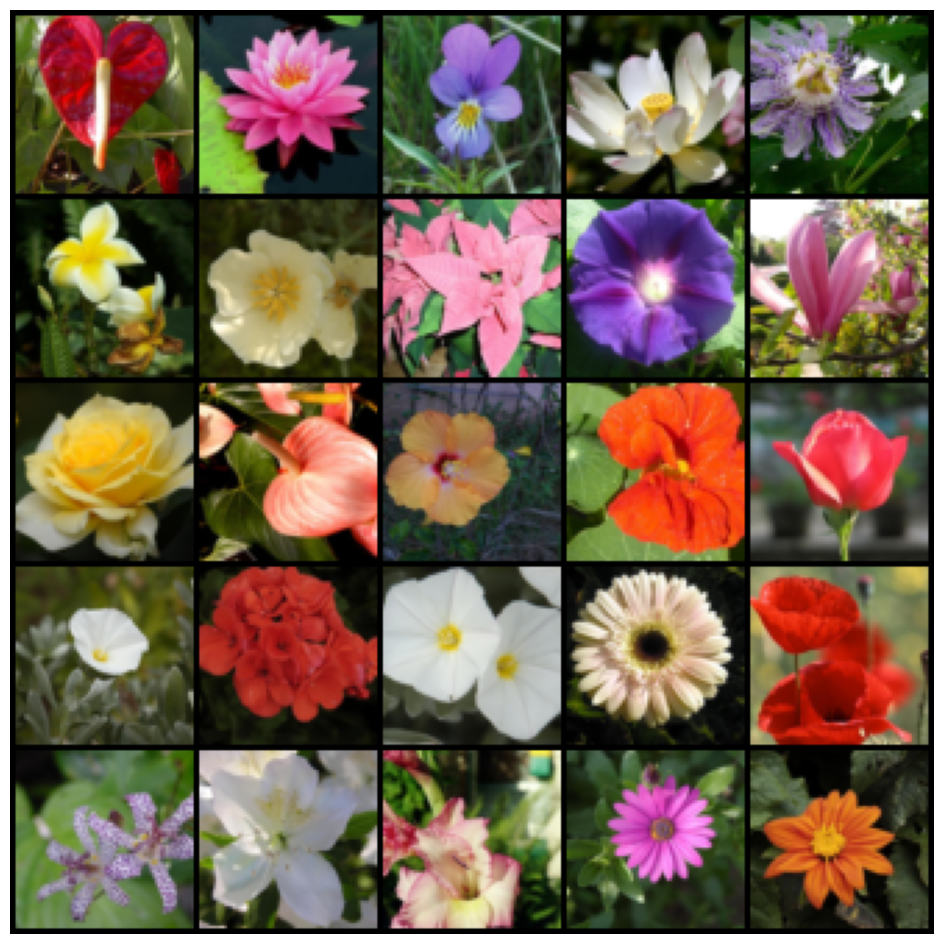

In [9]:
# Fetch a single batch of images
# Here, 'real_batch' will contain the images, and '_' ignores the second output which are the labels of the images.
real_batch, _ = next(iter(dataloader))

# Plot the images
# The 'show_tensor_images' function is called to display a grid of images from the batch.
# 'num_images=25' specifies the number of images to display from the batch.
# 'size=(3, 64, 64)' indicates the shape of the images as channels x height x width.
show_tensor_images(real_batch, num_images=25, size=(3, 64, 64))  # Adjust 'size' if your transform uses a different image size

In [10]:
# Instantiate the Generator and Critic models with the specified dimensions.
gen = Generator(z_dim).to(device)  # Generator with latent space dimension z_dim
crit = Critic().to(device)  # Critic for assessing the realism of generated images

# Configure optimizers for both the generator and critic.
# Adam optimizer is used here with specified learning rate and betas parameters for momentum.
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

# Define a function to initialize the weights of the models.
def weights_init(m):
    """
    Applies initial weights to certain layers in a model.
    - All convolutional layers receive weights from a normal distribution.
    - All batch normalization layers receive weights from a normal distribution and biases set to 0.
    """
    if isinstance(m, nn.Conv2d) and isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)  # Initialize Conv weights.
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)  # Initialize BatchNorm weights.
        torch.nn.init.constant_(m.bias, 0.0)  # Initialize BatchNorm biases.

# Check if multiple GPUs are available, and if so, use them.
if torch.cuda.device_count() > 1:
    print(f"Let's use {torch.cuda.device_count()} GPUs!")
    # Wrap the generator and critic models with DataParallel to utilize multiple GPUs.
    gen = nn.DataParallel(gen)
    crit = nn.DataParallel(crit)

# Apply the weight initialization function to every submodule in both models.
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)

Let's use 2 GPUs!


In [11]:
def get_gradient(crit, real, fake, epsilon):
    """
    Computes the gradients of the critic's scores with respect to linear interpolations
    of real and fake images.

    Parameters:
        crit (torch.nn.Module): The critic network whose gradient will be calculated.
        real (torch.Tensor): A batch of real images.
        fake (torch.Tensor): A batch of fake images generated by the generator.
        epsilon (torch.Tensor): A tensor of the same shape as the real and fake images,
                                containing random numbers between 0 and 1. These serve as
                                interpolation coefficients.

    Returns:
        torch.Tensor: The gradients of the critic's scores with respect to the interpolated images.
    """

    # Interpolate between real and fake images. 
    # Epsilon is broadcasted to match the shape of real and fake images automatically.
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Pass the mixed images through the critic to obtain the score for each mixed image.
    mixed_scores = crit(mixed_images)

    # Calculate the gradients of the scores with respect to the images.
    # grad_outputs should be a tensor of the same shape as mixed_scores,
    # filled with ones because we want the gradient of the scores themselves, not a reduction.
    gradient = torch.autograd.grad(
        inputs=mixed_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),  # This specifies that the gradient is taken
                                                     # with respect to each element in mixed_scores independently.
        create_graph=True,  # Allows further operations to be performed on the gradient tensor,
                            # which is necessary for calculating the gradient penalty later.
        retain_graph=True   # Retains the computation graph after computing the gradient,
                            # this is necessary if the same network needs further passes 
                            # with other operations or subsequent gradients.
    )[0]  # grad returns a tuple, and we need the first element which corresponds to our inputs.

    return gradient

In [12]:
def gradient_penalty(gradient):
    """
    Calculates the gradient penalty for enforcing the Lipschitz constraint on the critic.
    This is used in the training of WGAN-GP to ensure 1-Lipschitz continuity.

    Parameters:
        gradient (torch.Tensor): The gradients of the critic’s scores with respect to 
                                 the inputs (interpolated images).

    Returns:
        torch.Tensor: The calculated gradient penalty, a scalar value that is added 
                      to the critic's loss to penalize gradients with norms deviating from 1.
    """

    # Flatten the gradients so that each row represents a single image.
    # This reshaping is necessary to compute the norm across each individual gradient vector
    # corresponding to each image.
    gradient = gradient.view(len(gradient), -1)

    # Compute the Euclidean norm (L2 norm) of each gradient vector.
    # The 'norm' function calculates the magnitude of the vector, which should ideally be 1
    # for the 1-Lipschitz function as required by the Wasserstein GAN.
    gradient_norm = gradient.norm(2, dim=1)

    # Compute the penalty as the mean squared distance of the gradient norms from 1.
    # The penalty is applied when gradients are greater or smaller than 1,
    # encouraging the gradients to have a norm of exactly 1.
    penalty = torch.mean((gradient_norm - 1)**2)

    return penalty

In [13]:
def get_gen_loss(crit_fake_pred):
    """
    Calculate the generator's loss based on the critic's predictions of the generated (fake) images.

    Parameters:
        crit_fake_pred (torch.Tensor): The critic's scores for the fake images produced by the generator.
                                       These scores indicate how real or fake the critic thinks the images are.

    Returns:
        torch.Tensor: The calculated loss for the generator. The generator tries to maximize the
                      critic's scores for its images, which is equivalent to minimizing the negative
                      of these scores.
    """

    # Calculate the loss for the generator.
    # The generator’s loss is calculated as the negative mean of the critic’s scores on the generated images.
    # This formulation stems from the generator’s objective to maximize the critic's scores (i.e., make the critic
    # believe that the generated images are real). Maximizing the scores is equivalent to minimizing the negative
    # of these scores.
    gen_loss = -1. * torch.mean(crit_fake_pred)

    return gen_loss

In [14]:
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    """
    Calculate the loss for the critic in a GAN setup, incorporating the gradient penalty for stability.

    Parameters:
        crit_fake_pred (torch.Tensor): The critic's scores for the fake images generated by the generator.
        crit_real_pred (torch.Tensor): The critic's scores for the real images from the dataset.
        gp (torch.Tensor): The calculated gradient penalty, a regularization term to enforce the 1-Lipschitz condition.
        c_lambda (float): The weighting factor for the gradient penalty.

    Returns:
        torch.Tensor: The total loss for the critic, combining its ability to discriminate real and fake images
                      and its adherence to the Lipschitz constraint.
    """

    # Compute the critic's loss as the difference in average scores between the fake and real images.
    # The critic aims to maximize the score of real images and minimize the score of fake images, thus
    # the loss is computed as the mean score of the fake images subtracted from the mean score of the real images.
    crit_loss = torch.mean(crit_fake_pred) - torch.mean(crit_real_pred)

    # Add the gradient penalty to the loss, scaled by the lambda coefficient.
    # The gradient penalty helps ensure the critic function maintains the 1-Lipschitz continuity by penalizing
    # the gradient norm deviating from 1. This regularization helps stabilize the training process.
    crit_loss += c_lambda * gp

    return crit_loss

In [15]:
# Training configuration variables
n_epochs = 3000  # Total number of epochs to train
save_interval = 10  # Interval for saving model checkpoints
# Variable to store the epoch from which training starts; can be set to 0 for new training or to a specific epoch number for resuming
starting_epoch = 0  # or any other epoch number if resuming training

# Calculate the current step based on the starting epoch
# If the training is starting from the beginning (epoch 0), set cur_step to 0
# Otherwise, calculate cur_step as the number of batches processed up to the starting epoch
cur_step = 0 if starting_epoch == 0 else starting_epoch * len(dataloader)
# This logic ensures that cur_step accurately reflects the total number of training iterations that have occurred,
# which is crucial for logging, learning rate scheduling, or any other functionality that depends on the number of iterations.

# Initialize lists for storing loss values
generator_losses = []
critic_losses = []

# Training loop
for epoch in range(starting_epoch, n_epochs):
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)  # Get the current batch size
        real = real.to(device)  # Move real images to the appropriate device

        mean_iteration_critic_loss = 0  # Initialize mean critic loss for this batch

        # Train the critic
        for _ in range(crit_repeats):
            crit_opt.zero_grad()  # Zero the gradients of the critic optimizer
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)  # Generate random noise
            fake = gen(fake_noise)  # Generate fake images from the noise
            crit_fake_pred = crit(fake.detach())  # Detach fake from graph and get critic's prediction
            crit_real_pred = crit(real)  # Get critic's prediction on real images

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)  # Random weights for interpolation
            gradient = get_gradient(crit, real, fake.detach(), epsilon)  # Calculate the gradient penalty
            gp = gradient_penalty(gradient)  # Compute the gradient penalty
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)  # Compute critic loss

            mean_iteration_critic_loss += crit_loss.item() / crit_repeats  # Update mean critic loss
            crit_loss.backward(retain_graph=True)  # Backpropagate the loss
            crit_opt.step()  # Update critic's parameters

        critic_losses += [mean_iteration_critic_loss]  # Store the mean critic loss for this iteration

        # Train the generator
        gen_opt.zero_grad()  # Zero the gradients of the generator optimizer
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)  # Generate new random noise
        fake_2 = gen(fake_noise_2)  # Generate new fake images
        crit_fake_pred = crit(fake_2)  # Get critic's prediction on new fake images

        gen_loss = get_gen_loss(crit_fake_pred)  # Compute generator loss
        gen_loss.backward()  # Backpropagate the generator loss
        gen_opt.step()  # Update generator's parameters

        generator_losses += [gen_loss.item()]  # Store the generator loss

        # Visualization and logging
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step  # Average generator loss
            crit_mean = sum(critic_losses[-display_step:]) / display_step  # Average critic loss
            print(f"Epoch {epoch} Step {cur_step}: Generator loss: {gen_mean}, discriminator loss: {crit_mean}")
            show_tensor_images(fake, save_path=f"fake_image_at_epoch{epoch+1}")  # Show generated images
            show_tensor_images(real)  # Show real images
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins),
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label='Generator_Loss'
            )
            plt.plot(
                range(num_examples // step_bins),
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label='Critic_Loss'
            )
            plt.legend()
            plt.show()

        cur_step += 1  # Increment the step counter

    # Save checkpoints periodically
    if (epoch + 1) % save_interval == 0:
        os.makedirs('model_weights', exist_ok=True)  # Ensure the directory exists
        checkpoint_path = f"model_weights/checkpoint_epoch_{epoch+1}.pth"  # Define the checkpoint path

        # Save the model and optimizer states
        torch.save({
            'epoch': epoch + 1,
            'generator_state_dict': gen.state_dict(),
            'critic_state_dict': crit.state_dict(),
            'generator_optimizer_state_dict': gen_opt.state_dict(),
            'critic_optimizer_state_dict': crit_opt.state_dict(),
            'generator_losses': generator_losses,
            'critic_losses': critic_losses,
        }, checkpoint_path)

        print(f"Models saved at epoch {epoch+1}")  # Log the saving

  0%|          | 0/64 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [16]:
# This script creates an animated GIF from a series of images stored in a directory. Each image in the directory
# represents a snapshot of a model's output saved after every 100 epochs of training. The images are loaded,
# resized to 256x256 pixels for uniformity, and compiled into an animation. This visualization helps in 
# understanding how the model's outputs evolve over time during the training process. The final animation is
# displayed inline in a Jupyter notebook environment and saved to disk as a high-resolution GIF file.

# Specify the directory where snapshot images are stored
snapshot_dir = '/kaggle/input/snapshot-pics-1'
# List and sort files in the directory to ensure the images are ordered correctly
snapshot_files = sorted(os.listdir(snapshot_dir))

# List to hold the images after they are loaded and processed
img_list = []

# Loop over each file in the sorted list of snapshot files
for filename in snapshot_files:
    # Check if the file is a PNG image
    if filename.endswith('png'):
        # Construct the full path to the image file
        img_path = os.path.join(snapshot_dir, filename)
        # Open the image file using PIL
        img = Image.open(img_path)
        # Resize the image to 256x256 pixels using ANTIALIAS to enhance the quality of the image
        img = img.resize((256, 256), Image.ANTIALIAS)
        # Convert the image to a numpy array and append to the list of images
        img_list.append(np.asarray(img))

# Create a figure object for displaying the animation
fig = plt.figure(figsize=(10,10))
# Turn off the axes to make the animation cleaner
plt.axis('off')

# Create the animation by plotting each image. 'animated=True' is used to indicate that these plots will be used in animation.
img = [[plt.imshow(img, animated=True)] for img in img_list]
# Create an animation by compiling these images, with a delay of 1000ms between frames and a repeat delay of 1000ms
ani = animation.ArtistAnimation(fig, img, interval=1000, repeat_delay=1000, blit=True)

# Display the animation as HTML using IPython display capabilities
HTML(ani.to_jshtml())

# Save the animation to a file as a GIF, which can be useful for presentations or sharing
ani.save('generated_image_animation.gif', writer='imagemagick', dpi=300)

FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/input/snapshot-pics-1'

In [17]:
def get_truncated_noise(n_samples, z_dim, truncation, device='cpu'):
    '''
    Generates truncated noise vectors to feed into a generator of a Generative Adversarial Network (GAN).
    Truncated noise often helps in stabilizing the training process and improving the quality of generated images
    by limiting the range of values in the noise vectors.

    Parameters:
        n_samples (int): The number of noise vectors to generate.
        z_dim (int): The dimensionality of each noise vector.
        truncation (float): The truncation threshold used to limit the values of the noise vectors.
                            Typically, this is a positive value less than or equal to 2. The noise values are
                            truncated to the range [-truncation, truncation].
        device (str): The device to create the noise tensors on. It can be 'cpu' or 'cuda' for GPU.

    Returns:
        torch.Tensor: A tensor of shape (n_samples, z_dim) containing truncated normal noise,
                      which can be directly used as input to the generator.
    '''
    # Generate random numbers from a truncated normal distribution defined within the range
    # [-truncation, truncation] and shape (n_samples, z_dim).
    truncated_noise = truncnorm.rvs(-truncation, truncation, size=(n_samples, z_dim))
    
    # Convert the numpy array containing the truncated normal values to a PyTorch tensor.
    # The conversion ensures compatibility with PyTorch models and operations.
    # The tensor is then transferred to the specified device (CPU or GPU),
    # making it ready for use in a deep learning model.
    return torch.Tensor(truncated_noise).to(device)

In [18]:
# Instantiate the Generator model with the specified dimensionality for the input noise vector
gen = Generator(z_dim).to(device)

# Load the checkpoint
# Checkpoints are typically saved PyTorch dictionaries including model weights, optimizer states, etc.
# 'map_location' is used to ensure that the checkpoint is loaded onto the correct device
checkpoint = torch.load("/kaggle/input/checkpoint-3000/checkpoint_epoch_3000.pth", map_location=torch.device(device))

# Modify the state_dict to remove the 'module.' prefix
# This step is necessary when the model was originally trained using DataParallel, which
# adds 'module.' as a prefix to all parameter keys. Since we are loading the model without DataParallel,
# we need to remove this prefix to match the expected key format.
state_dict = checkpoint['generator_state_dict']
new_state_dict = {key.replace('module.', ''): value for key, value in state_dict.items()}

# Restore the states of the generator
# This involves setting the saved weights from the checkpoint to the model's parameters.
gen.load_state_dict(new_state_dict)

# Set the generator to evaluation mode
# This is important because some layers like BatchNorm and Dropout behave differently
# during training vs during testing (evaluation). Setting to eval mode ensures that
# the network behaves consistently during inference, using accumulated statistics for BatchNorm
# and disabling Dropout.
gen = gen.eval()

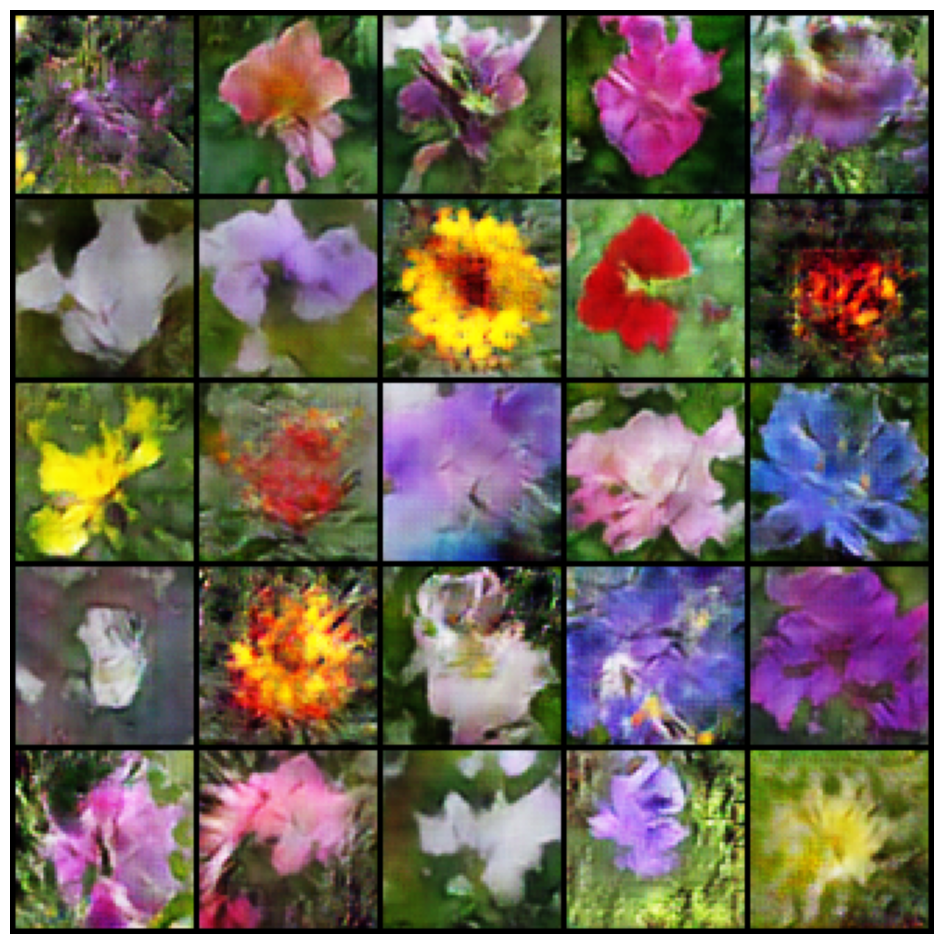

In [20]:
# Number of images to generate
num_images = 25

# Generate noise vectors with the specified dimension 'z_dim' and number for the batch
# The noise serves as input to the generator
noise = get_noise(num_images, z_dim).to(device)

# Ensure that no gradients are computed for operations within this block
# This is important because generating images does not require gradient computation,
# which can save memory and computation during the inference phase
with torch.no_grad():
    # Generate fake images from the noise vectors using the generator
    # The generator uses the noise to produce images that mimic the training data
    fake_images = gen(noise)

# Display the generated images using a predefined function
# The 'show_tensor_images' function is expected to handle the tensor format of images,
# display them in a grid, and handle any necessary post-processing like normalization
show_tensor_images(fake_images)

Image saved to truncated_images/output_truncation_0.5_image.png


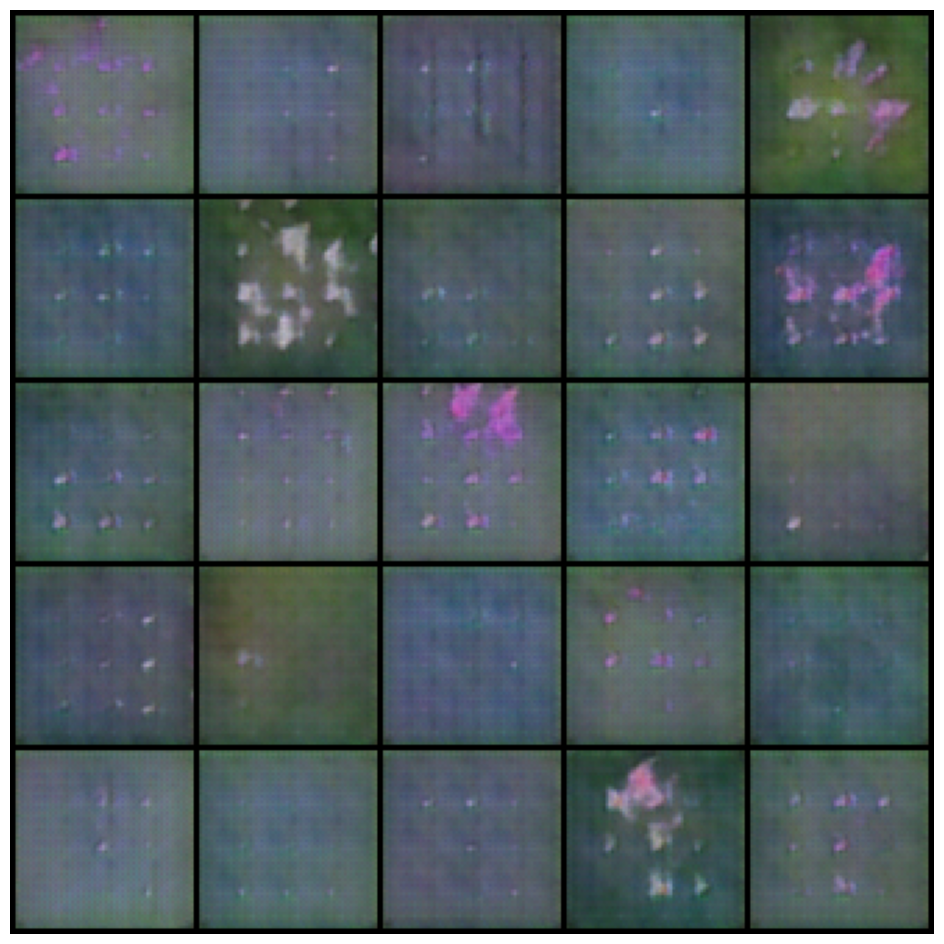

Image saved to truncated_images/output_truncation_1_image.png


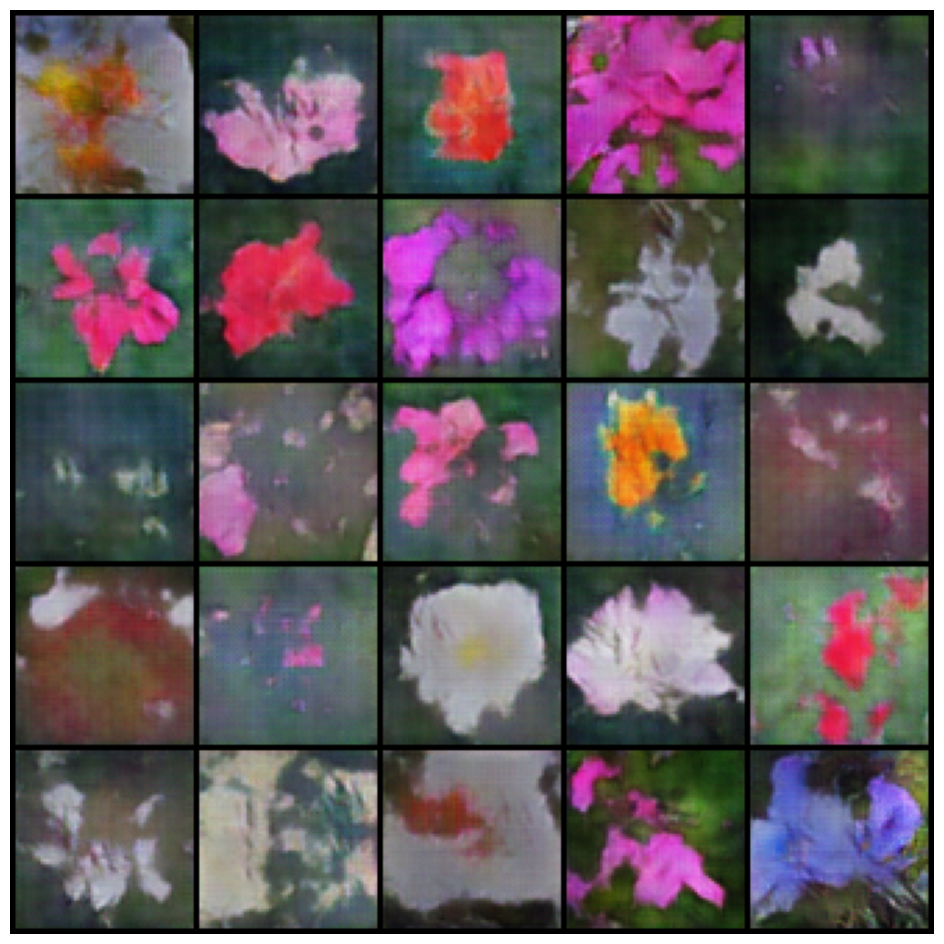

Image saved to truncated_images/output_truncation_5_image.png


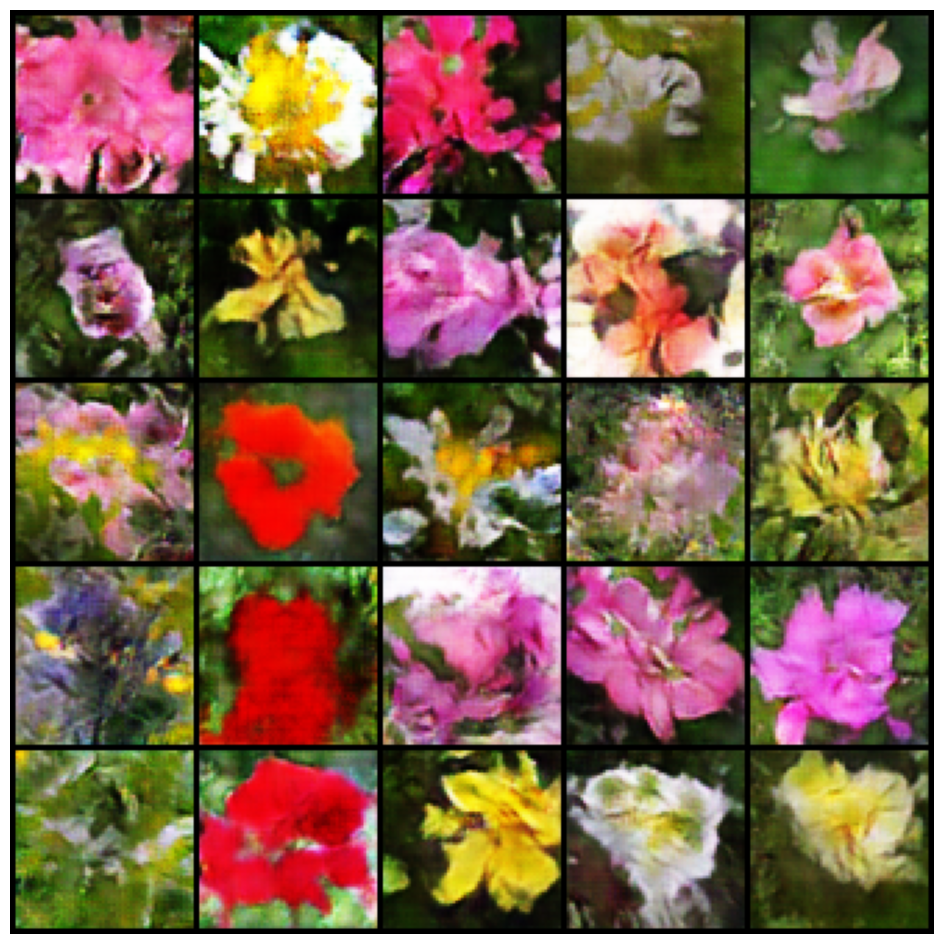

Image saved to truncated_images/output_truncation_10_image.png


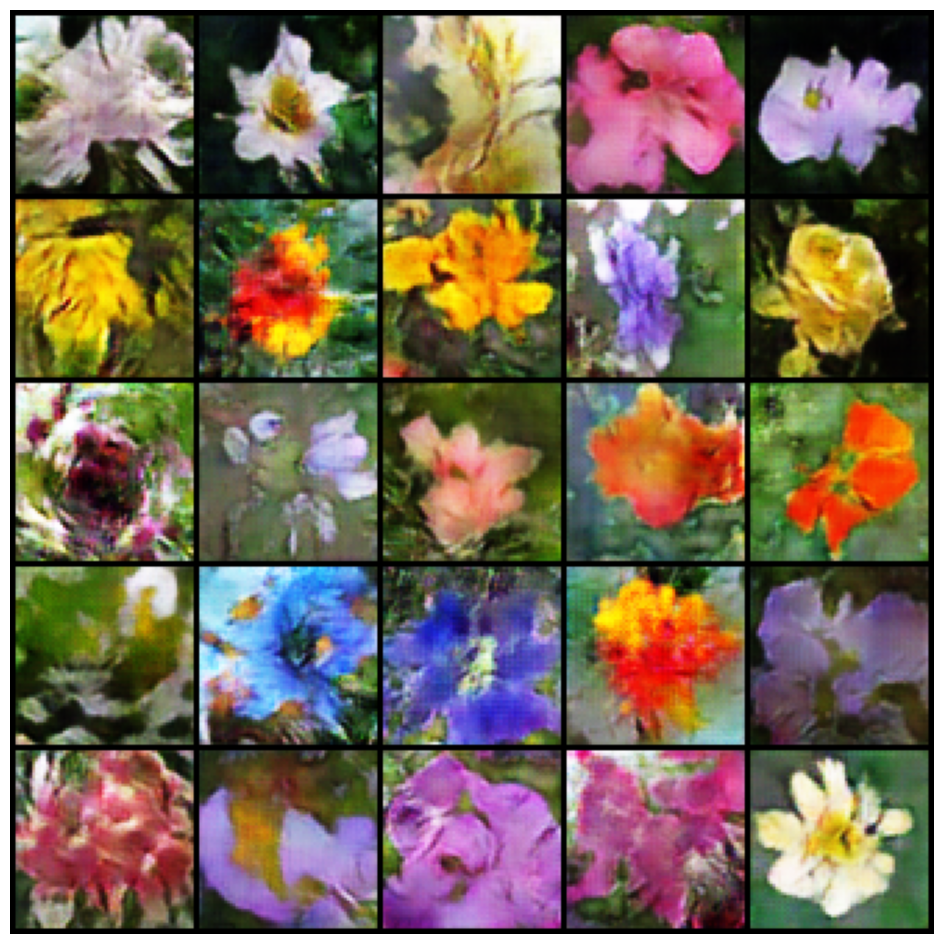

Image saved to truncated_images/output_truncation_15_image.png


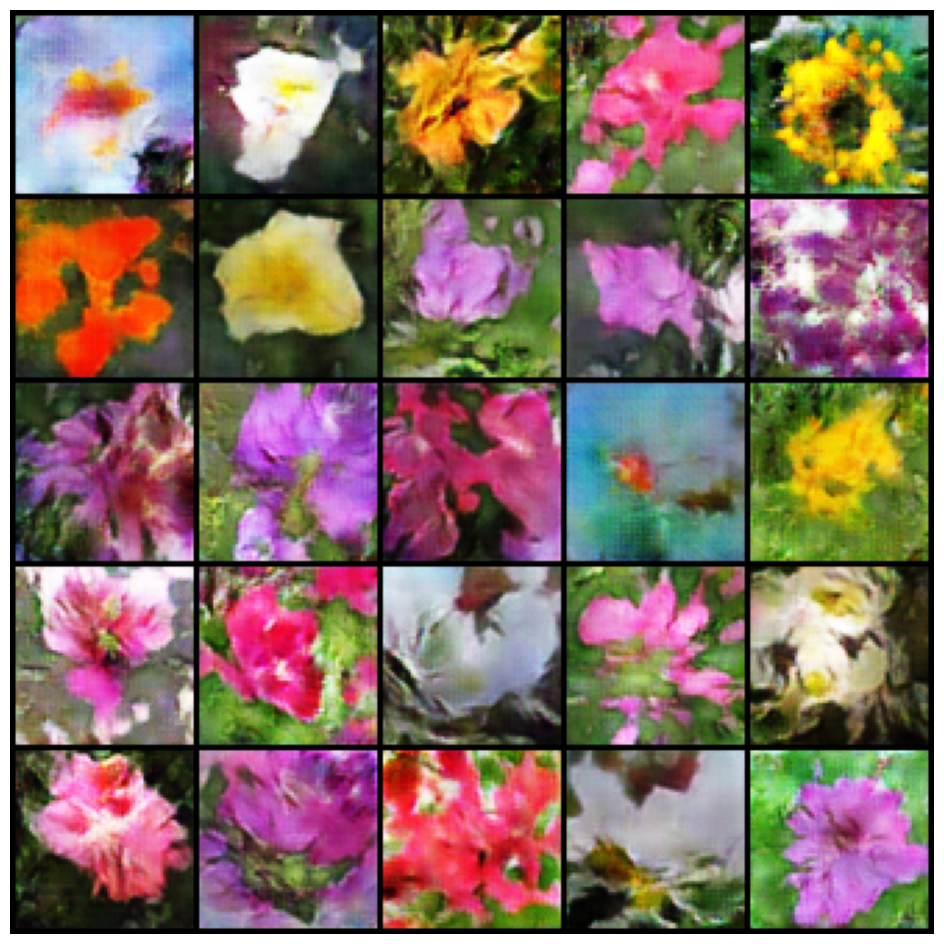

Image saved to truncated_images/output_truncation_20_image.png


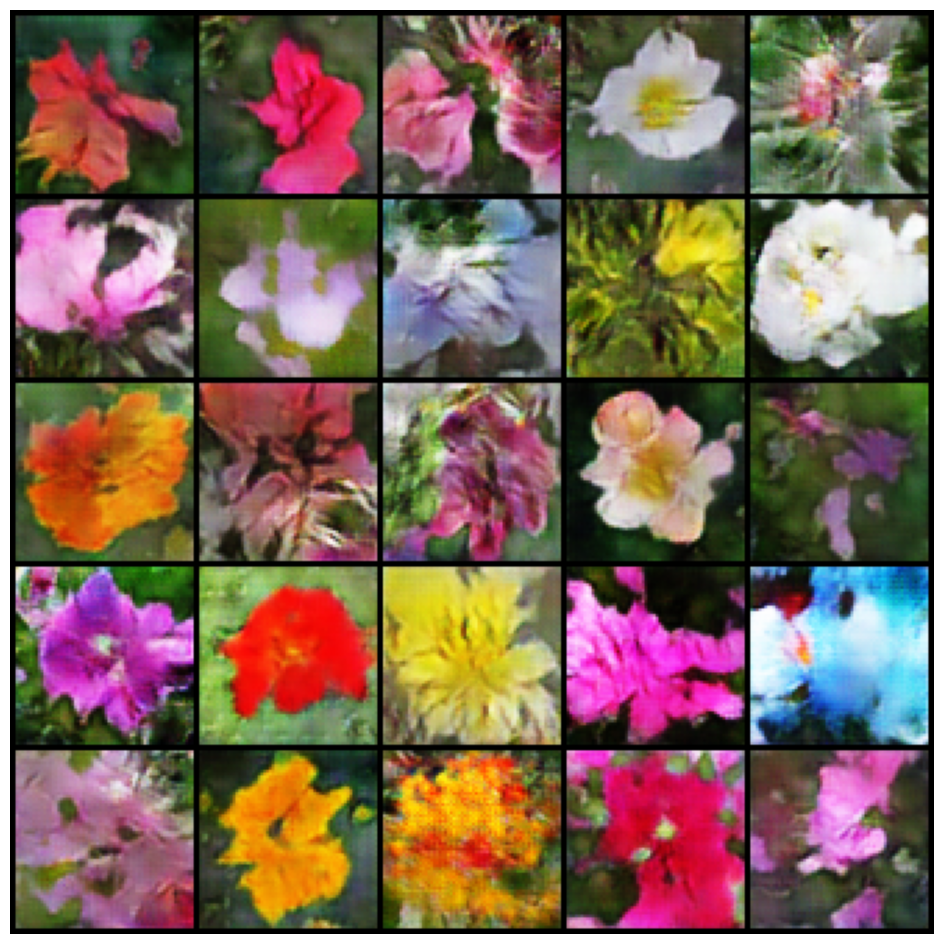

Image saved to truncated_images/output_truncation_25_image.png


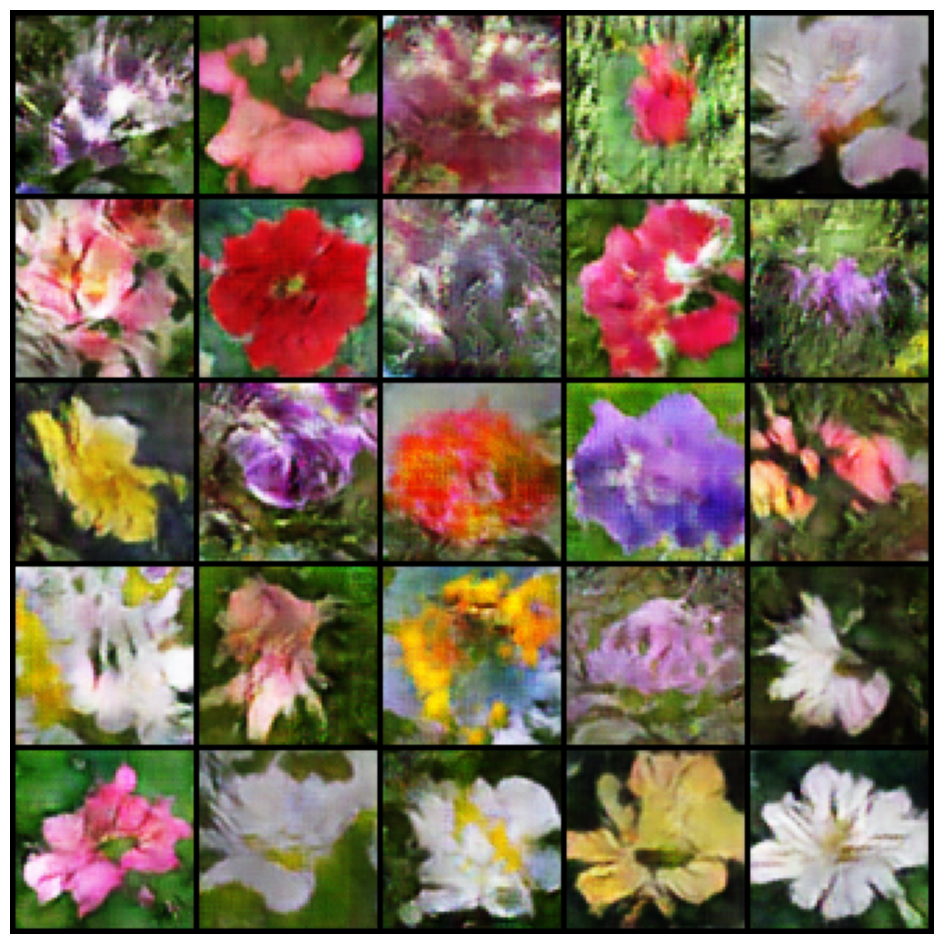

In [21]:
# Number of images to generate
num_images = 25

# Define a range of truncation values to explore their impact on generated image quality and diversity
truncation_values = [0.5, 1, 5, 10, 15, 20, 25]

for truncation in truncation_values:
    # Generate truncated noise vectors using a specified truncation level
    trunc_noise = get_truncated_noise(num_images, z_dim, truncation, device=device)

    # Generate images without tracking gradients for efficiency
    with torch.no_grad():
        fake_images = gen(trunc_noise)
    
    # Ensure directory exists to save generated images
    if not os.path.exists("truncated_images"):
        os.makedirs("truncated_images")
    
    # Define the filename for saving the images
    filename = f"truncated_images/output_truncation_{truncation}_image.png"
    
    # Save and optionally display the generated images
    # The function `show_tensor_images` should handle conversion from tensors to image files
    # and also save the images to the specified filename
    show_tensor_images(fake_images, save_path=filename)

In [22]:
# Initialize the Inception v3 model
# 'pretrained=False' indicates that we do not load the default pretrained weights at initialization
# because we are going to load a specific pre-trained set of weights immediately afterward
inception_model = inception_v3(pretrained=False)

# Load the pre-trained weights from a specified path
# This path contains the weights for the Inception model that has been trained on a dataset like ImageNet
# These weights are typically used to leverage the model's learned feature representations
inception_model.load_state_dict(
    torch.load(
        "/kaggle/input/inception-v3-pretrained/inception_v3_google-0cc3c7bd.pth"
    )
)

# Move the model to the appropriate computational device (GPU or CPU)
inception_model.to(device)

# Set the model to evaluation mode
# This is crucial as Inception v3 has components like batch normalization and dropout layers
# that behave differently during training and inference. Evaluation mode sets these layers to behave consistently
# based on the learned statistics during training, suitable for inference tasks
inception_model = inception_model.eval()

# Modify the output layer (fc layer) of the Inception model to do nothing (Identity function)
# This is commonly done when the model is used as a feature extractor, where we are interested in the outputs
# of the last convolutional layer rather than the final classification output layer
inception_model.fc = torch.nn.Identity()

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/opt/conda/lib/python3.10/site-packages/torchvision/models/inception.py:43: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  warnings.warn(


In [23]:
def matrix_sqrt(x):
    '''
    Computes the square root of a square matrix. Given a matrix A, the function returns matrix B,
    where B*B = A. This is used in applications such as computing the Fréchet Inception Distance (FID)
    between feature distributions of real and generated images.

    Parameters:
        x (torch.Tensor): A torch.Tensor representing a square matrix. It must be a 2D tensor.

    Returns:
        torch.Tensor: A tensor of the same shape as 'x', representing the square root of the matrix 'x'.
    '''
    # Detach the tensor from the current graph and move it to CPU for compatibility with SciPy
    y = x.cpu().detach().numpy()

    # Compute the square root of the matrix using SciPy's sqrtm function, which handles both
    # real and complex eigenvalues, making it suitable for any square matrix provided.
    y_sqrt = scipy.linalg.sqrtm(y)

    # Since sqrtm can sometimes produce a complex matrix even for real matrices (due to numerical errors),
    # it's necessary to only take the real part of the matrix to ensure compatibility with most applications.
    if np.iscomplexobj(y_sqrt):
        y_sqrt = y_sqrt.real  # Discard the imaginary parts if present.

    # Convert the resulting real square root matrix back to a PyTorch tensor,
    # ensuring it's on the same device as the original input tensor for further computations.
    return torch.from_numpy(y_sqrt).to(x.device)

In [24]:
def frechet_distance(mu_x, mu_y, sigma_x, sigma_y):
    '''
    Calculates the Fréchet distance between two multivariate Gaussian distributions, parameterized
    by their means and covariance matrices. This distance metric is often used in the context of
    generative models, particularly to assess the quality of synthetic images relative to real images.

    Parameters:
        mu_x (torch.Tensor): The mean vector of the first Gaussian distribution, of shape (n_features,).
        mu_y (torch.Tensor): The mean vector of the second Gaussian distribution, of shape (n_features,).
        sigma_x (torch.Tensor): The covariance matrix of the first Gaussian distribution, 
                                of shape (n_features, n_features).
        sigma_y (torch.Tensor): The covariance matrix of the second Gaussian distribution,
                                of shape (n_features, n_features).

    Returns:
        torch.Tensor: A scalar tensor representing the Fréchet distance between the two distributions.
    '''

    # Calculate the squared Euclidean distance between the two mean vectors.
    # This represents the squared magnitude of the difference between the centers of the Gaussians.
    diff = mu_x - mu_y
    mean_diff_squared = torch.dot(diff, diff)  # dot product of the difference with itself

    # Compute the trace of the covariance matrices. The trace of a matrix is the sum of its diagonal elements
    # and represents the variance of the distribution along its dimensions.
    trace_x = torch.trace(sigma_x)
    trace_y = torch.trace(sigma_y)

    # Compute the square root of the product of the two covariance matrices.
    # This operation involves matrix multiplication followed by taking the square root of the resulting matrix,
    # which is needed to compute the similarity in the spread and orientation of the two distributions.
    product_sqrt = matrix_sqrt(torch.mm(sigma_x, sigma_y))
    trace_sqrt_product = torch.trace(product_sqrt)

    # Calculate the Fréchet distance using the formula for the distance between two Gaussians.
    # The formula includes the trace of the individual covariance matrices and the trace of the square root
    # of the product of the covariance matrices.
    return mean_diff_squared + trace_x + trace_y - 2 * trace_sqrt_product

In [25]:
def preprocess(img):
    """
    This function resizes a batch of images to a specified size using bilinear interpolation, preparing them
    for input into models like Inception v3 that require fixed-size inputs. Bilinear interpolation helps in
    maintaining the quality of the image during the resizing process.

    Parameters:
        img (torch.Tensor): A 4D tensor of shape (N, C, H, W), where
                            N is the number of images (batch size),
                            C is the number of color channels (e.g., 3 for RGB),
                            H is the height of the images,
                            W is the width of the images.

    Returns:
        torch.Tensor: A tensor containing the resized images, maintaining the batch size and channel dimensions
                      but with height and width adjusted to 299 x 299.

    Raises:
        ValueError: If the input is not a 4D tensor, a ValueError is raised with a message explaining that
                    the function expects a batch of images in the correct format.
    """
    # Ensure the input image tensor is in the correct 4D format (batch size, channels, height, width)
    if img.dim() != 4:
        raise ValueError("Expected input tensor to be a 4D (batch, channels, height, width)")

    # Use bilinear interpolation for resizing the image
    # This method considers the closest 2x2 neighborhood of known pixel values surrounding the unknown pixel's
    # computed location and derives a value from these to get the best estimate for the pixel's actual value.
    img = torch.nn.functional.interpolate(img, size=(299, 299), mode='bilinear', align_corners=False)

    return img

In [26]:
def get_covariance(features):
    """
    Computes the covariance matrix from a batch of features. This matrix describes the variance of
    each feature and the covariances between features.

    Parameters:
        features (torch.Tensor): A 2D tensor where each row represents an observation (data point)
                                 and each column represents a feature.

    Returns:
        torch.Tensor: A 2D tensor representing the covariance matrix of the input features. The shape
                      of the output matrix is (n_features, n_features), where n_features is the number
                      of features.

    Notes:
        The function uses 'rowvar=False' to treat rows as observations and columns as variables (features),
        which aligns with common statistical practices where each feature is a variable and each observation
        is an independent sample.
    """
    # Detach the tensor from any previous computation graph and convert it to a NumPy array
    # This conversion is necessary because numpy.cov does not directly support PyTorch tensors
    features_np = features.detach().numpy()

    # Calculate the covariance matrix using numpy's cov function, which computes covariance between pairs of features
    covariance_matrix = np.cov(features_np, rowvar=False)

    # Convert the resulting numpy array back to a torch.Tensor to maintain consistency with PyTorch workflows
    return torch.Tensor(covariance_matrix)

In [29]:
# Model setup
gen.eval()  # Set the generator to evaluation mode

# Define sample and batch size parameters
n_samples = 8000  # Total number of samples to evaluate
batch_size = 32   # Number of samples processed per batch
image_size = 299  # The image size expected by the Inception model

# Setup a sequence of transformations to preprocess the images
transform = transforms.Compose([
    transforms.Resize(image_size),  # Resize the shortest side of the image to 'image_size'
    transforms.CenterCrop(image_size),  # Crop a square of size 'image_size' from the center of the image
    transforms.ToTensor(),  # Convert the image to a PyTorch tensor
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),  # Normalize the tensor by scaling RGB values to be between -1 and 1
])

# Specify the path to the dataset
dataset_path = '/kaggle/input/pytorch-challange-flower-dataset'

# Load the dataset from the specified path and apply the preprocessing transformations
dataset = datasets.ImageFolder(root=dataset_path, transform=transform)

# DataLoader setup for the real dataset
dataloader = DataLoader(
    dataset,
    batch_size=batch_size,
    shuffle=True)

# Initialize lists to store features for real and generated images
fake_features_list = []
real_features_list = []

cur_samples = 0
with torch.no_grad():  # Context manager that disables gradient calculation
    try:
        # Iterate over the dataset
        for real_example, _ in tqdm(dataloader, total=n_samples // batch_size):
            real_samples = real_example
            # Process real images through the Inception model and collect features
            real_features = inception_model(real_samples.to(device)).detach().to('cpu')  # Detach from GPU and move to CPU
            real_features_list.append(real_features)

            # Generate fake images from noise, preprocess them, and collect features
            fake_samples = get_noise(len(real_example), z_dim).to(device)
            fake_images = preprocess(gen(fake_samples))  # Generate and preprocess fake images
            fake_features = inception_model(fake_images).detach().to('cpu')  # Detach from GPU and move to CPU
            fake_features_list.append(fake_features)

            cur_samples += len(real_samples)
            if cur_samples >= n_samples:  # Stop once the specified number of samples is reached
                break
    except Exception as e:
        print(f"Error in loop: {str(e)}")  # Print any errors that occur during the feature extraction loop

# Concatenate all feature tensors to form a single tensor for real and fake features
fake_features_all = torch.cat(fake_features_list)
real_features_all = torch.cat(real_features_list)

# Calculate the mean of the features from the real and fake samples
mu_fake = fake_features_all.mean(0)
mu_real = real_features_all.mean(0)

# Calculate the covariance matrices of the real and fake features
sigma_fake = get_covariance(fake_features_all)
sigma_real = get_covariance(real_features_all)

  0%|          | 0/250 [00:00<?, ?it/s]

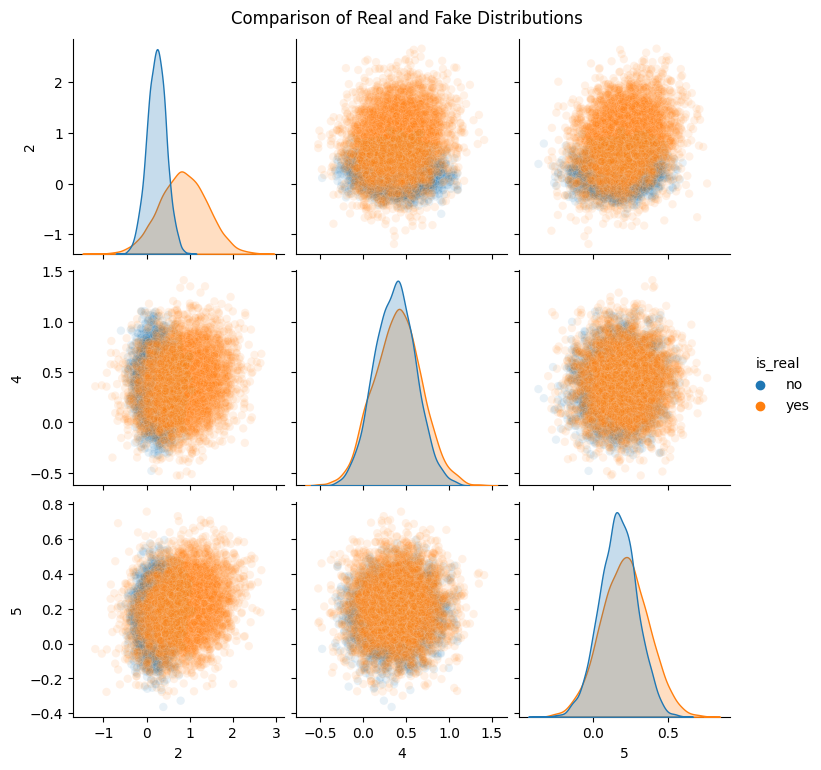

In [30]:
# Suppress specific FutureWarnings from seaborn and pandas to maintain clean output
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")
warnings.filterwarnings("ignore", category=FutureWarning, module="pandas.core.common")

# Define indices for the selected features to be analyzed
indices = [2, 4, 5]

# Create multivariate normal distributions for the selected real and fake feature subsets
# These distributions are based on the means and covariance matrices sliced according to the chosen indices
fake_dist = MultivariateNormal(mu_fake[indices], sigma_fake[indices][:, indices])
real_dist = MultivariateNormal(mu_real[indices], sigma_real[indices][:, indices])

# Sample data from the distributions
# Sampling 5000 points to ensure sufficient data for a smooth distribution representation
fake_samples = fake_dist.sample((5000,))
real_samples = real_dist.sample((5000,))

# Convert the samples into Pandas DataFrames for easier manipulation and visualization
# Each column in the DataFrame corresponds to one of the selected indices/features
df_fake = pd.DataFrame(fake_samples.numpy(), columns=[str(i) for i in indices])
df_real = pd.DataFrame(real_samples.numpy(), columns=[str(i) for i in indices])
df_fake["is_real"] = "no"  # Label fake samples
df_real["is_real"] = "yes"  # Label real samples

# Concatenate the fake and real dataframes to facilitate combined visualization
df = pd.concat([df_fake, df_real])

# Use seaborn to create pair plots of the distributions of selected features
# 'hue' parameter uses the 'is_real' column to color points by whether they are from real or fake distributions
g = sns.pairplot(df, plot_kws={'alpha': 0.1}, hue='is_real')

# Enhance the plot with a title and ensure it does not overlap with other elements
g.fig.suptitle("Comparison of Real and Fake Distributions", y=1.02)

# Save the generated plot to a file
plt.savefig("real_vs_fake_distribution_comparison.png")
plt.show()
plt.close(g.fig)  # Close the plot figure to free up memory

In [31]:
# Use a context manager to temporarily set all the required gradients to zero, optimizing memory usage and computation
with torch.no_grad():
    # Compute the Fréchet Distance between the real and fake data distributions
    # The Fréchet Distance is calculated using the means and covariance matrices of the Inception features
    # extracted from the real and generated images.
    # This is a crucial metric in evaluating GAN performance, as it compares how similar the generated images are
    # to the real images in terms of content and style captured by the deep features.
    fid_score = frechet_distance(mu_real, mu_fake, sigma_real, sigma_fake).item()

# Output the calculated Fréchet Inception Distance score
print("Fréchet Distance (FID) Score:", fid_score)

Fréchet Distance (FID) Score: 163.62991333007812
